In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [6]:
import os
import random
import shutil
import numpy as np
import matplotlib.pyplot as plt
import librosa
import librosa.display
import soundfile as sf
from collections import Counter
from tqdm import trange
from google.colab import drive
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset


In [ ]:
import os

# Chemins des datasets
ravdess_path = '/content/drive/My Drive/deeplearning/RAVDESS/'  # Sous-dossiers inclus
wav_path = '/content/drive/My Drive/deeplearning/wav/'  # Chemin corrigé

# Fonction pour récupérer les fichiers audio dans les sous-dossiers
def load_audio_paths(dataset_path):
    audio_files = []
    for root, _, files in os.walk(dataset_path):  # Parcours récursif
        for file in files:
            if file.endswith('.wav'):
                audio_files.append(os.path.join(root, file))
    return audio_files

# Charger les fichiers audio
ravdess_files = load_audio_paths(ravdess_path)
wav_files = load_audio_paths(wav_path)

# Affichage des résultats
print(f"Total fichiers RAVDESS : {len(ravdess_files)}")
print(f"Total fichiers WAV (Allemand) : {len(wav_files)}")

# Afficher quelques fichiers pour vérifier
print("\nExemples de fichiers RAVDESS :")
print(ravdess_files[:5])  # Affiche les 5 premiers fichiers

print("\nExemples de fichiers WAV :")
print(wav_files[:5])  # Affiche les 5 premiers fichiers


Total fichiers RAVDESS : 5343
Total fichiers WAV (Allemand) : 0

Exemples de fichiers RAVDESS :
['/content/drive/My Drive/deeplearning/RAVDESS/audio_speech_actors_01-24/Actor_22/03-01-02-02-01-01-22.wav', '/content/drive/My Drive/deeplearning/RAVDESS/audio_speech_actors_01-24/Actor_22/03-01-07-02-01-01-22.wav', '/content/drive/My Drive/deeplearning/RAVDESS/audio_speech_actors_01-24/Actor_22/03-01-05-01-02-02-22.wav', '/content/drive/My Drive/deeplearning/RAVDESS/audio_speech_actors_01-24/Actor_22/03-01-02-01-02-01-22.wav', '/content/drive/My Drive/deeplearning/RAVDESS/audio_speech_actors_01-24/Actor_22/03-01-07-01-01-02-22.wav']

Exemples de fichiers WAV :
[]


In [ ]:
import librosa
import os

# Fonction pour afficher la fréquence d'échantillonnage
def display_sampling_rate(dataset_path, dataset_name):
    print(f"\n--- {dataset_name} ---")

    # Parcourir les fichiers audio (récursivement)
    for root, _, files in os.walk(dataset_path):
        for file in files:
            if file.endswith('.wav'):
                file_path = os.path.join(root, file)

                # Charger l'audio avec librosa
                audio, sr = librosa.load(file_path, sr=None)  # sr=None garde la fréquence d'origine

                print(f"Audio: {file} - Fréquence d'échantillonnage : {sr} Hz")
                return  # Affiche seulement la fréquence du premier fichier audio trouvé

# Afficher les fréquences d'échantillonnage
display_sampling_rate(ravdess_path, "RAVDESS")
display_sampling_rate(wav_path, "EMODB")



--- RAVDESS ---
Audio: 03-01-02-02-01-01-20.wav - Fréquence d'échantillonnage : 48000 Hz

--- EMODB ---
Audio: 03a01Fa.wav - Fréquence d'échantillonnage : 16000 Hz


# Resampling

In [ ]:
import librosa
import soundfile as sf
import os

# Fonction pour resampler les fichiers audio à 22 050 Hz et afficher les fréquences
def resample_and_display(dataset_path, dataset_name):
    print(f"\n--- Resampling {dataset_name} ---")
    for root, _, files in os.walk(dataset_path):
        for file in files:
            if file.lower().endswith('.wav'):
                file_path = os.path.join(root, file)

                # Charger l'audio avec la fréquence d'origine
                audio, sr = librosa.load(file_path, sr=None)
                print(f"Audio: {file} - Fréquence initiale : {sr} Hz")

                # Resampler si nécessaire
                if sr != 22050:
                    audio = librosa.resample(audio, orig_sr=sr, target_sr=22050)

                    # Sauvegarder le fichier resamplé
                    output_path = os.path.join(root, f"resampled_{file}")
                    sf.write(output_path, audio, 22050)  # Enregistrer avec soundfile

                    print(f"Resampled {file} from {sr} Hz to 22,050 Hz. Saved as {output_path}")
                else:
                    print(f"{file} est déjà à 22,050 Hz.")

                # Afficher la fréquence après resampling
                print(f"Audio: {file} - Fréquence finale : 22050 Hz\n")

                return  # Affiche seulement le premier fichier

# Chemins des datasets
ravdess_path = '/content/drive/My Drive/deeplearning/RAVDESS/'
emodb_path = '/content/drive/My Drive/deeplearning/wav/'

# Resampling et affichage des fréquences
resample_and_display(ravdess_path, "RAVDESS")
resample_and_display(emodb_path, "EMODB")



--- Resampling RAVDESS ---
Audio: 03-01-02-02-01-01-20.wav - Fréquence initiale : 48000 Hz
Resampled 03-01-02-02-01-01-20.wav from 48000 Hz to 22,050 Hz. Saved as /content/drive/My Drive/deeplearning/RAVDESS/Actor_20/resampled_03-01-02-02-01-01-20.wav
Audio: 03-01-02-02-01-01-20.wav - Fréquence finale : 22050 Hz


--- Resampling EMODB ---
Audio: 03a01Fa.wav - Fréquence initiale : 16000 Hz
Resampled 03a01Fa.wav from 16000 Hz to 22,050 Hz. Saved as /content/drive/My Drive/deeplearning/wav/resampled_03a01Fa.wav
Audio: 03a01Fa.wav - Fréquence finale : 22050 Hz



# Determine Longest Sample Duration

In [ ]:
import librosa
import os

# Fonction pour déterminer la durée maximale des fichiers audio
def find_max_duration(dataset_path):
    max_duration = 0
    for root, _, files in os.walk(dataset_path):
        for file in files:
            if file.lower().endswith('.wav'):
                file_path = os.path.join(root, file)
                audio, _ = librosa.load(file_path, sr=None)
                duration = librosa.get_duration(y=audio)
                max_duration = max(max_duration, duration)

    return max_duration

# Chemins des datasets
ravdess_path = '/content/drive/My Drive/deeplearning/RAVDESS/'
emodb_path = '/content/drive/My Drive/deeplearning/wav/'

# Calcul de la durée maximale
max_duration_ravdess = find_max_duration(ravdess_path)
max_duration_emodb = find_max_duration(emodb_path)

max_duration = max(max_duration_ravdess, max_duration_emodb)
print(f"Durée maximale trouvée : {max_duration:.2f} secondes")


Durée maximale trouvée : 10.00 secondes


# Pad Audio Files to 10 Seconds

In [ ]:
import numpy as np
import soundfile as sf

# Fonction pour ajouter du padding à 10 secondes
def pad_audio_to_fixed_length(dataset_path, dataset_name, target_duration=10):
    print(f"\n--- Padding {dataset_name} to {target_duration} seconds ---")
    for root, _, files in os.walk(dataset_path):
        for file in files:
            if file.lower().endswith('.wav'):
                file_path = os.path.join(root, file)

                # Charger l'audio
                audio, sr = librosa.load(file_path, sr=None)
                duration = librosa.get_duration(y=audio, sr=sr)

                # Appliquer le padding si nécessaire
                if duration < target_duration:
                    padding_length = int(sr * (target_duration - duration))
                    audio = np.pad(audio, (0, padding_length), mode='constant')

                    # Sauvegarder le fichier
                    output_path = os.path.join(root, f"{file}")
                    sf.write(output_path, audio, sr)
                    print(f"Padded {file} to {target_duration} seconds.")
                else:
                    print(f"{file} already meets or exceeds {target_duration} seconds.")

# Padding pour RAVDESS et EMODB
pad_audio_to_fixed_length(ravdess_path, "RAVDESS")
pad_audio_to_fixed_length(emodb_path, "EMODB")



--- Padding RAVDESS to 10 seconds ---
Padded 03-01-02-02-01-01-20.wav to 10 seconds.
Padded 03-01-01-01-01-01-20.wav to 10 seconds.
Padded 03-01-01-01-02-01-20.wav to 10 seconds.
Padded 03-01-01-01-01-02-20.wav to 10 seconds.
Padded 03-01-02-01-02-02-20.wav to 10 seconds.
Padded 03-01-02-01-02-01-20.wav to 10 seconds.
Padded 03-01-02-01-01-01-20.wav to 10 seconds.
Padded 03-01-02-02-02-01-20.wav to 10 seconds.
Padded 03-01-01-01-02-02-20.wav to 10 seconds.
Padded 03-01-03-01-01-01-20.wav to 10 seconds.
Padded 03-01-02-01-01-02-20.wav to 10 seconds.
Padded 03-01-02-02-01-02-20.wav to 10 seconds.
Padded 03-01-02-02-02-02-20.wav to 10 seconds.
Padded 03-01-03-01-02-01-20.wav to 10 seconds.
Padded 03-01-03-02-02-01-20.wav to 10 seconds.
Padded 03-01-07-02-01-01-20.wav to 10 seconds.
Padded 03-01-08-02-02-01-20.wav to 10 seconds.
Padded 03-01-04-02-01-01-20.wav to 10 seconds.
Padded 03-01-04-01-01-01-20.wav to 10 seconds.
Padded 03-01-05-01-01-02-20.wav to 10 seconds.
Padded 03-01-08-01-02

In [ ]:
import os
import shutil

# Emotion labels for RAVDESS (3rd group in filename)
ravdess_emotions = {
    '01': 'neutral',
    '02': 'calm',
    '03': 'happy',
    '04': 'sad',
    '05': 'angry',
    '06': 'fearful',
    '07': 'disgust',
    '08': 'surprised'
}

source_ravdess = "/content/drive/MyDrive/deeplearning/RAVDESS"
dest_ravdess = "/content/drive/MyDrive/deeplearning/ravdess_organized"

os.makedirs(dest_ravdess, exist_ok=True)

for root, _, files in os.walk(source_ravdess):
    for file in files:
        if file.endswith(".wav"):
            emotion_code = file.split("-")[2]
            emotion = ravdess_emotions.get(emotion_code, "unknown")
            dest_folder = os.path.join(dest_ravdess, emotion)
            os.makedirs(dest_folder, exist_ok=True)
            shutil.copy(os.path.join(root, file), os.path.join(dest_folder, file))


In [ ]:
emodb_emotions = {
    'W': 'angry',
    'L': 'boredom',
    'E': 'disgust',
    'A': 'fear',
    'F': 'happy',
    'N': 'neutral',
    'T': 'sad'
}

source_emodb = "/content/drive/MyDrive/deeplearning/wav"
# Already in place — if you want to move to organized folders
# dest_emodb = "/content/drive/MyDrive/deeplearning/emodb_organized"

for file in os.listdir(source_emodb):
    if file.endswith(".wav"):
        emotion_code = file[5]
        emotion = emodb_emotions.get(emotion_code, "unknown")
        dest_folder = os.path.join(source_emodb, emotion)
        os.makedirs(dest_folder, exist_ok=True)
        shutil.move(os.path.join(source_emodb, file), os.path.join(dest_folder, file))


In [ ]:
import os

# Change this to your actual path
base_path = "/content/drive/My Drive/deeplearning/RAVDESS_organized/"

# Parcourir les dossiers d'émotions
for emotion in os.listdir(base_path):
    emotion_path = os.path.join(base_path, emotion)
    if os.path.isdir(emotion_path):
        print(f"\n📁 Emotion: {emotion}")
        audio_files = [f for f in os.listdir(emotion_path) if f.endswith('.wav')]
        for file in audio_files[:5]:  # afficher les 5 premiers fichiers
            print(f"  🎵 {file}")
        print(f"  Total: {len(audio_files)} fichiers")



📁 Emotion: neutral
  🎵 resampled_03-01-01-01-01-01-01.wav
  🎵 03-01-01-01-01-01-01.wav
  🎵 03-01-01-01-01-02-01.wav
  🎵 03-01-01-01-02-01-02.wav
  🎵 03-01-01-01-01-02-02.wav
  Total: 97 fichiers

📁 Emotion: calm
  🎵 03-01-02-02-01-02-01.wav
  🎵 03-01-02-02-02-02-01.wav
  🎵 03-01-02-01-01-01-01.wav
  🎵 03-01-02-01-02-02-01.wav
  🎵 03-01-02-02-01-01-01.wav
  Total: 192 fichiers

📁 Emotion: happy
  🎵 03-01-03-02-01-01-01.wav
  🎵 03-01-03-01-01-01-02.wav
  🎵 03-01-03-02-02-01-01.wav
  🎵 03-01-03-02-01-01-02.wav
  🎵 03-01-03-01-01-01-01.wav
  Total: 192 fichiers

📁 Emotion: sad
  🎵 03-01-04-02-02-02-01.wav
  🎵 03-01-04-01-02-02-01.wav
  🎵 03-01-04-01-01-01-01.wav
  🎵 03-01-04-01-02-01-01.wav
  🎵 03-01-04-02-01-02-01.wav
  Total: 192 fichiers

📁 Emotion: angry
  🎵 03-01-05-01-01-02-01.wav
  🎵 03-01-05-01-01-01-01.wav
  🎵 03-01-05-01-02-01-01.wav
  🎵 03-01-05-02-02-02-01.wav
  🎵 03-01-05-01-02-02-01.wav
  Total: 192 fichiers

📁 Emotion: fearful
  🎵 03-01-06-02-01-01-01.wav
  🎵 03-01-06-01-02

In [ ]:
import os

# Change this to your actual path
base_path = "/content/drive/My Drive/deeplearning/wav/"

# Parcourir les dossiers d'émotions
for emotion in os.listdir(base_path):
    emotion_path = os.path.join(base_path, emotion)
    if os.path.isdir(emotion_path):
        print(f"\n📁 Emotion: {emotion}")
        audio_files = [f for f in os.listdir(emotion_path) if f.endswith('.wav')]
        for file in audio_files[:5]:  # afficher les 5 premiers fichiers
            print(f"  🎵 {file}")
        print(f"  Total: {len(audio_files)} fichiers")



📁 Emotion: unknown
  Total: 0 fichiers

📁 Emotion: angry
  🎵 03a02Wb.wav
  🎵 10a05Wb.wav
  🎵 03a01Wa.wav
  🎵 03b10Wb.wav
  🎵 10a04Wa.wav
  Total: 129 fichiers

📁 Emotion: happy
  🎵 03a02Fc.wav
  🎵 03a01Fa.wav
  🎵 08b01Fd.wav
  🎵 08a04Ff.wav
  🎵 11a04Fd.wav
  Total: 72 fichiers

📁 Emotion: neutral
  🎵 03a07Nc.wav
  🎵 03a02Nc.wav
  🎵 03a01Nc.wav
  🎵 03b02Na.wav
  🎵 09a07Na.wav
  Total: 161 fichiers

📁 Emotion: sad
  🎵 03a02Ta.wav
  🎵 08a04Tb.wav
  🎵 08b09Tb.wav
  🎵 09b03Ta.wav
  🎵 03b09Tc.wav
  Total: 63 fichiers

📁 Emotion: fear
  🎵 08b09Ab.wav
  🎵 08a01Ab.wav
  🎵 08b10Aa.wav
  🎵 11a01Aa.wav
  🎵 10a01Ac.wav
  Total: 70 fichiers

📁 Emotion: disgust
  🎵 09a02Ea.wav
  🎵 11a02Ec.wav
  🎵 09b03Ed.wav
  🎵 09b09Ea.wav
  🎵 09a01Ea.wav
  Total: 47 fichiers


In [ ]:
import os
import shutil

# Paths
emodb_path = "/content/drive/MyDrive/deeplearning/wav"
boredom_dir = os.path.join(emodb_path, "boredom")
neutral_dir = os.path.join(emodb_path, "neutral")

# Move files from 'boredom' to 'neutral'
if os.path.exists(boredom_dir):
    for file in os.listdir(boredom_dir):
        src = os.path.join(boredom_dir, file)
        dst = os.path.join(neutral_dir, file)
        shutil.move(src, dst)
    os.rmdir(boredom_dir)  # Delete empty 'boredom' folder

In [ ]:
def load_data_with_labels(data_path):
    files, labels = [], []
    for emotion in os.listdir(data_path):
        emotion_path = os.path.join(data_path, emotion)
        if os.path.isdir(emotion_path):
            for file in os.listdir(emotion_path):
                if file.endswith(".wav"):
                    files.append(os.path.join(emotion_path, file))
                    labels.append(emotion)
    return files, labels

ravdess_files, ravdess_labels = load_data_with_labels("/content/drive/MyDrive/deeplearning/RAVDESS_organized")
emodb_files, emodb_labels = load_data_with_labels("/content/drive/MyDrive/deeplearning/wav")

In [ ]:
print("RAVDESS - Files:", len(ravdess_files), "Labels:", len(ravdess_labels))
print("EMO-DB - Files:", len(emodb_files), "Labels:", len(emodb_labels))


RAVDESS - Files: 1441 Labels: 1441
EMO-DB - Files: 542 Labels: 542


In [ ]:
from collections import Counter

print("RAVDESS label distribution:", Counter(ravdess_labels))
print("EMO-DB label distribution:", Counter(emodb_labels))


RAVDESS label distribution: Counter({'calm': 192, 'happy': 192, 'sad': 192, 'angry': 192, 'fearful': 192, 'disgust': 192, 'surprised': 192, 'neutral': 97})
EMO-DB label distribution: Counter({'neutral': 161, 'angry': 129, 'happy': 72, 'fear': 70, 'sad': 63, 'disgust': 47})


In [ ]:
import os
import shutil
import librosa
import numpy as np

# Parameters
n_fft = 1024
hop_length = 256
n_mels = 128
sr = 22050  # Target sampling rate
duration = 10  # seconds
expected_length = int(sr * duration)

# Base paths
input_root = "/content/drive/MyDrive/deeplearning"  # Adjust as needed
output_root = os.path.join(input_root, "mel_spectrograms")

datasets = {
    "ravdess": os.path.join(input_root, "RAVDESS_organized"),
    "emodb": os.path.join(input_root, "wav")
}

# Label standardization mapping
label_mapping = {
    "angry": "angry",
    "calm": "neutral",       # merged
    "disgust": "disgust",
    "fear": "fear",
    "fearful": "fear",
    "happy": "happy",
    "neutral": "neutral",
    "sad": "sad",
    "surprised": "surprised"  # only in RAVDESS; optional to keep
}

# Delete old spectrograms to avoid mixing
shutil.rmtree(os.path.join(output_root, "emodb"), ignore_errors=True)
shutil.rmtree(os.path.join(output_root, "ravdess"), ignore_errors=True)

# Function to process and save mel spectrograms
def process_dataset(dataset_name, dataset_path):
    print(f"\nProcessing dataset: {dataset_name}")

    for emotion in os.listdir(dataset_path):
        raw_emotion = emotion.lower()
        if raw_emotion not in label_mapping:
            print(f"⚠️ Skipped unknown emotion folder: {emotion}")
            continue

        standardized_emotion = label_mapping[raw_emotion]
        emotion_path = os.path.join(dataset_path, emotion)
        if not os.path.isdir(emotion_path):
            continue

        for file in os.listdir(emotion_path):
            if not file.endswith(".wav"):
                continue

            file_path = os.path.join(emotion_path, file)

            try:
                y, _ = librosa.load(file_path, sr=sr)

                # Pad or truncate to fixed length (10 seconds)
                if len(y) < expected_length:
                    y = np.pad(y, (0, expected_length - len(y)), mode='constant')
                else:
                    y = y[:expected_length]

                # Mel spectrogram
                mel_spec = librosa.feature.melspectrogram(y=y, sr=sr, n_fft=n_fft,
                                                          hop_length=hop_length, n_mels=n_mels)
                mel_db = librosa.power_to_db(mel_spec, ref=np.max)

                # Z-score normalization
                mel_norm = (mel_db - np.mean(mel_db)) / np.std(mel_db)

                # Output path
                output_dir = os.path.join(output_root, dataset_name, standardized_emotion)
                os.makedirs(output_dir, exist_ok=True)
                output_file = os.path.join(output_dir, file.replace(".wav", ".npy"))

                # Save
                np.save(output_file, mel_norm)
                print(f"✅ Saved: {output_file}")

            except Exception as e:
                print(f"❌ Error with {file_path}: {e}")

# Run for both datasets
for name, path in datasets.items():
    process_dataset(name, path)



Processing dataset: ravdess
✅ Saved: /content/drive/MyDrive/deeplearning/mel_spectrograms/ravdess/neutral/resampled_03-01-01-01-01-01-01.npy
✅ Saved: /content/drive/MyDrive/deeplearning/mel_spectrograms/ravdess/neutral/03-01-01-01-01-01-01.npy
✅ Saved: /content/drive/MyDrive/deeplearning/mel_spectrograms/ravdess/neutral/03-01-01-01-01-02-01.npy
✅ Saved: /content/drive/MyDrive/deeplearning/mel_spectrograms/ravdess/neutral/03-01-01-01-02-01-02.npy
✅ Saved: /content/drive/MyDrive/deeplearning/mel_spectrograms/ravdess/neutral/03-01-01-01-01-02-02.npy
✅ Saved: /content/drive/MyDrive/deeplearning/mel_spectrograms/ravdess/neutral/03-01-01-01-02-02-02.npy
✅ Saved: /content/drive/MyDrive/deeplearning/mel_spectrograms/ravdess/neutral/03-01-01-01-02-02-01.npy
✅ Saved: /content/drive/MyDrive/deeplearning/mel_spectrograms/ravdess/neutral/03-01-01-01-02-01-01.npy
✅ Saved: /content/drive/MyDrive/deeplearning/mel_spectrograms/ravdess/neutral/03-01-01-01-01-01-02.npy
✅ Saved: /content/drive/MyDrive/de

In [ ]:

import os

# Set the directory where spectrograms are saved
spectrogram_dir = "/content/drive/MyDrive/deeplearning/mel_spectrograms"

# List all .npy files and their sizes
for root, _, files in os.walk(spectrogram_dir):
    for file in files:
        if file.endswith('.npy'):
            file_path = os.path.join(root, file)
            file_size = os.path.getsize(file_path) / 1024  # Size in KB
            print(f"File: {file} - Size: {file_size:.2f} KB")


File: ravdess_resampled_03-01-01-01-01-01-01.npy - Size: 431.12 KB
File: ravdess_03-01-01-01-01-01-01.npy - Size: 431.12 KB
File: ravdess_03-01-01-01-01-02-01.npy - Size: 431.12 KB
File: ravdess_03-01-01-01-02-01-02.npy - Size: 431.12 KB
File: ravdess_03-01-01-01-01-02-02.npy - Size: 431.12 KB
File: ravdess_03-01-01-01-02-02-02.npy - Size: 431.12 KB
File: ravdess_03-01-01-01-02-02-01.npy - Size: 431.12 KB
File: ravdess_03-01-01-01-02-01-01.npy - Size: 431.12 KB
File: ravdess_03-01-01-01-01-01-02.npy - Size: 431.12 KB
File: ravdess_03-01-01-01-02-01-03.npy - Size: 431.12 KB
File: ravdess_03-01-01-01-02-02-03.npy - Size: 431.12 KB
File: ravdess_03-01-01-01-01-01-03.npy - Size: 431.12 KB
File: ravdess_03-01-01-01-01-02-03.npy - Size: 431.12 KB
File: ravdess_03-01-01-01-01-02-04.npy - Size: 431.12 KB
File: ravdess_03-01-01-01-02-02-04.npy - Size: 431.12 KB
File: ravdess_03-01-01-01-02-01-04.npy - Size: 431.12 KB
File: ravdess_03-01-01-01-01-01-04.npy - Size: 431.12 KB
File: ravdess_03-01-0

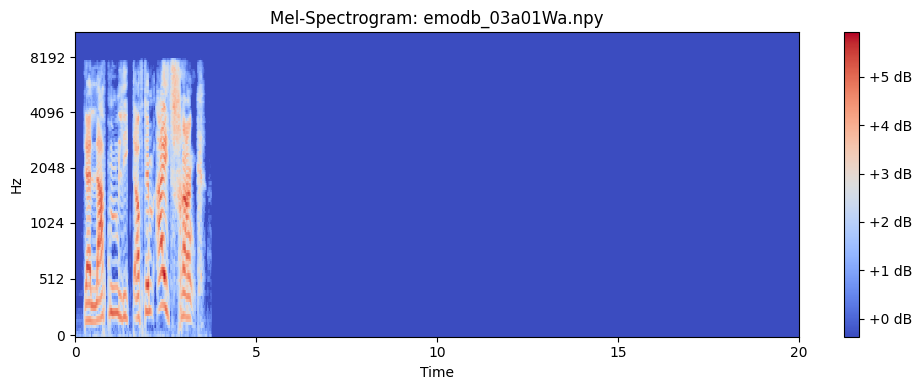

In [ ]:
import numpy as np
import librosa.display
import matplotlib.pyplot as plt

def visualize_saved_mel(file_path):
    mel_spec = np.load(file_path)  # Load the .npy file
    plt.figure(figsize=(10, 4))
    librosa.display.specshow(mel_spec, x_axis='time', y_axis='mel')
    plt.colorbar(format='%+2.0f dB')
    plt.title(f"Mel-Spectrogram: {os.path.basename(file_path)}")
    plt.tight_layout()
    plt.show()

# Visualize a sample mel spectrogram
visualize_saved_mel("/content/drive/MyDrive/deeplearning/mel_spectrograms/merged/angry/emodb_03a01Wa.npy")


In [ ]:
import os

spectrogram_dir = "/content/drive/MyDrive/deeplearning/mel_spectrograms"
total_size = 0

# Calculate total size of all .npy files
for root, _, files in os.walk(spectrogram_dir):
    for file in files:
        if file.endswith('.npy'):
            total_size += os.path.getsize(os.path.join(root, file))

# Convert to GB
total_size_gb = total_size / (1024**3)
print(f"Total size of spectrograms: {total_size_gb:.2f} GB")


Total size of spectrograms: 1.63 GB


In [ ]:
import os
import shutil
import random

# Set random seed for reproducibility
random.seed(42)

# Paths
base_dir = "/content/drive/MyDrive/deeplearning/mel_spectrograms"
merged_dir = os.path.join(base_dir, "merged")
train_dir = os.path.join(base_dir, "train")
val_dir = os.path.join(base_dir, "val")

# Clean existing folders
for d in [merged_dir, train_dir, val_dir]:
    if os.path.exists(d):
        shutil.rmtree(d)
    os.makedirs(d)

# Step 1: Merge both datasets
for dataset in ["ravdess", "emodb"]:
    dataset_path = os.path.join(base_dir, dataset)
    for emotion in os.listdir(dataset_path):
        emotion_path = os.path.join(dataset_path, emotion)
        merged_emotion_path = os.path.join(merged_dir, emotion)
        os.makedirs(merged_emotion_path, exist_ok=True)

        for file in os.listdir(emotion_path):
            if file.endswith(".npy"):
                src = os.path.join(emotion_path, file)
                # Add dataset name as prefix to avoid filename conflicts
                dst = os.path.join(merged_emotion_path, f"{dataset}_{file}")
                shutil.copy(src, dst)

# Step 2: Train/Validation split
split_ratio = 0.8

for emotion in os.listdir(merged_dir):
    all_files = os.listdir(os.path.join(merged_dir, emotion))
    random.shuffle(all_files)

    split_idx = int(len(all_files) * split_ratio)
    train_files = all_files[:split_idx]
    val_files = all_files[split_idx:]

    # Create folders
    os.makedirs(os.path.join(train_dir, emotion), exist_ok=True)
    os.makedirs(os.path.join(val_dir, emotion), exist_ok=True)

    # Copy files
    for f in train_files:
        shutil.copy(
            os.path.join(merged_dir, emotion, f),
            os.path.join(train_dir, emotion, f)
        )
    for f in val_files:
        shutil.copy(
            os.path.join(merged_dir, emotion, f),
            os.path.join(val_dir, emotion, f)
        )

print("✅ Data merged and split into 'train' and 'val' folders.")


✅ Data merged and split into 'train' and 'val' folders.


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Total training files: 1584
Total validation files: 399


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 0/100 - Loss: 0.433653 - Val Loss: 0.398059


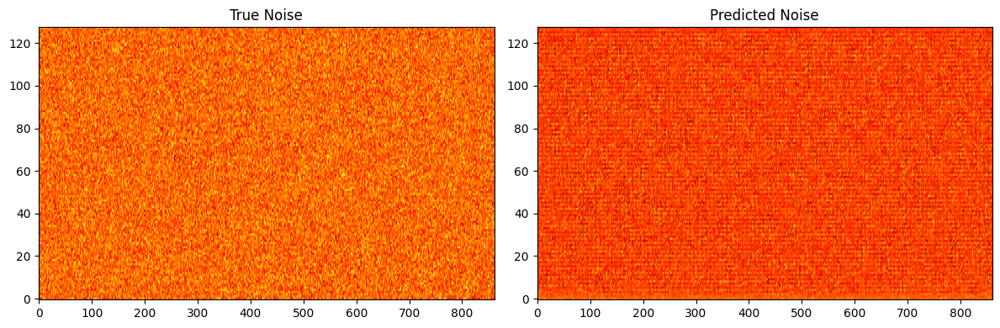

Training:  10%|█         | 10/100 [29:25<4:25:13, 176.82s/it]

Epoch 10/100 - Loss: 0.053151 - Val Loss: 0.041719


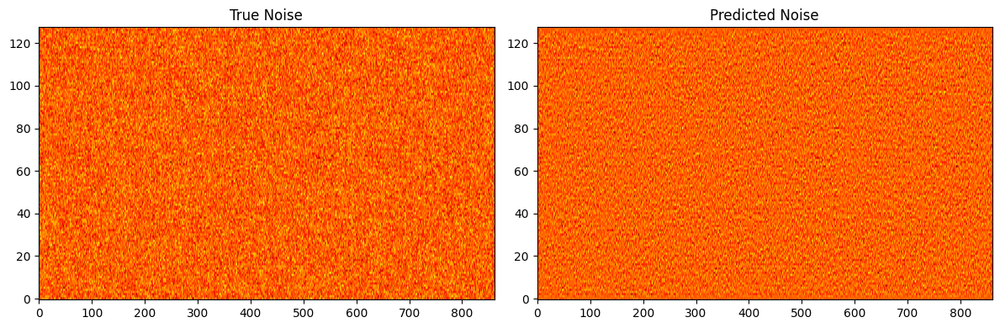

Training:  20%|██        | 20/100 [58:20<3:50:22, 172.78s/it]

Epoch 20/100 - Loss: 0.034289 - Val Loss: 0.032343


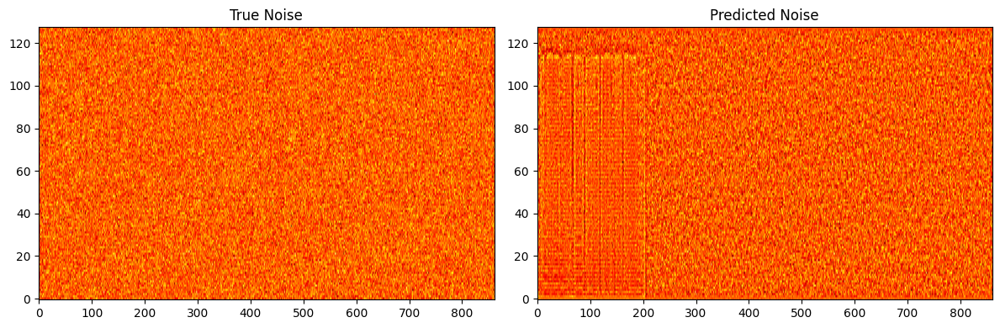

Training:  30%|███       | 30/100 [1:27:45<3:22:38, 173.70s/it]

Epoch 30/100 - Loss: 0.023561 - Val Loss: 0.033248


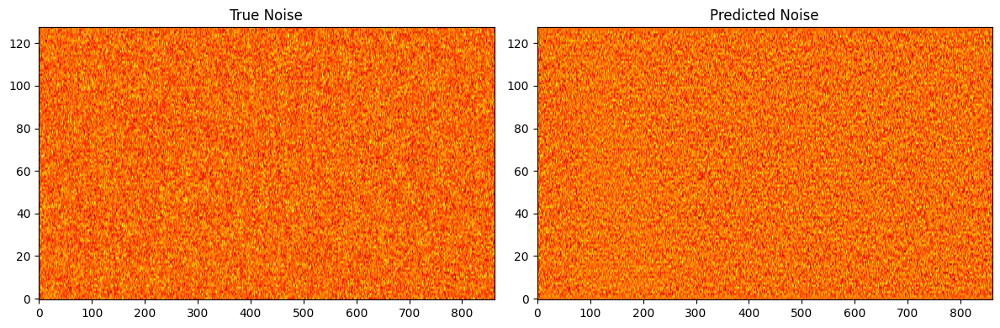

Training:  40%|████      | 40/100 [1:57:01<2:53:56, 173.93s/it]

Epoch 40/100 - Loss: 0.017344 - Val Loss: 0.016216


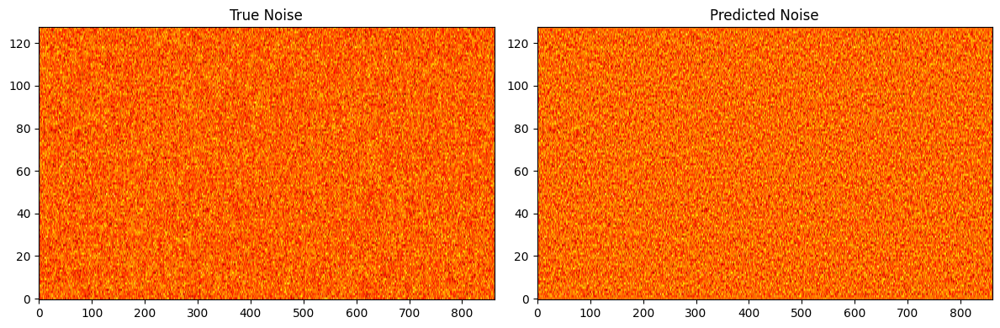

Training:  50%|█████     | 50/100 [2:25:38<2:23:26, 172.14s/it]

Epoch 50/100 - Loss: 0.017279 - Val Loss: 0.014613


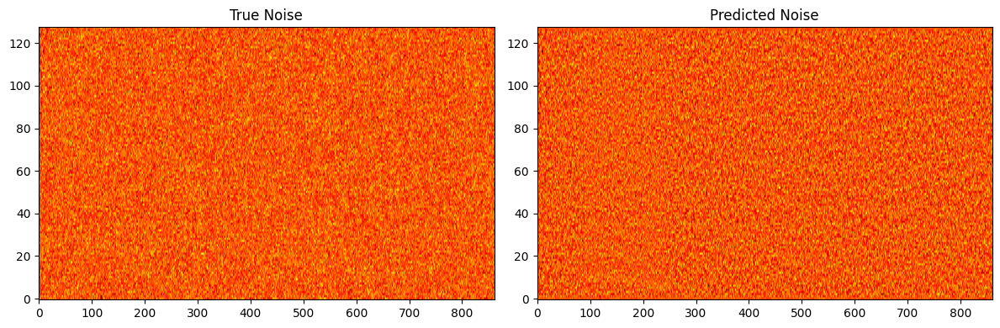

Training:  60%|██████    | 60/100 [2:54:42<1:56:29, 174.75s/it]

Epoch 60/100 - Loss: 0.016698 - Val Loss: 0.040341


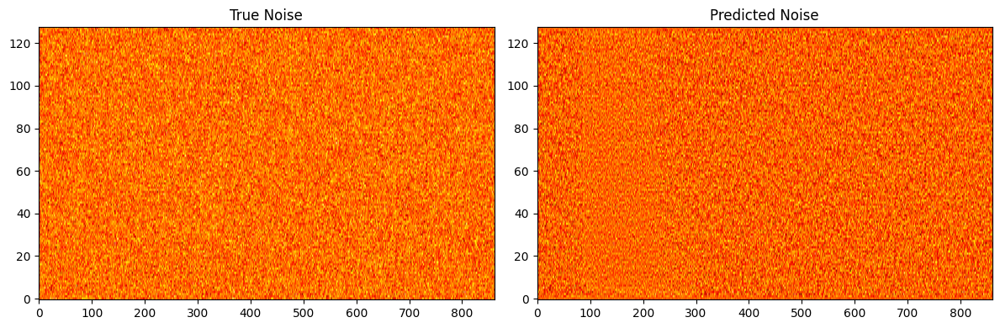

Training:  70%|███████   | 70/100 [3:23:48<1:26:46, 173.56s/it]

Epoch 70/100 - Loss: 0.116493 - Val Loss: 0.040235


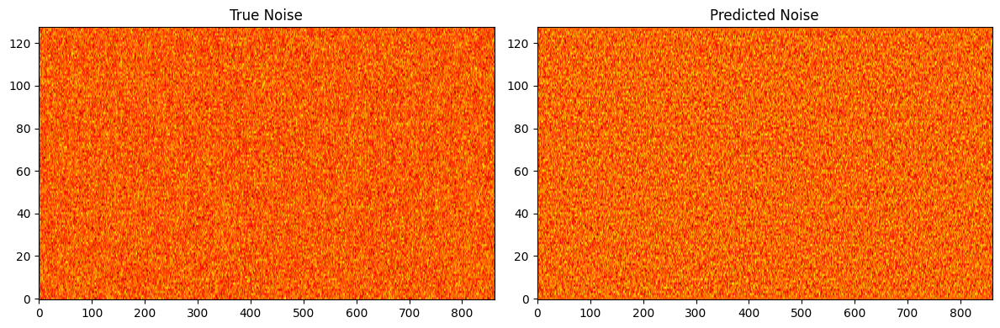

Training:  80%|████████  | 80/100 [3:52:56<58:39, 176.00s/it]  

Epoch 80/100 - Loss: 0.037090 - Val Loss: 0.016467


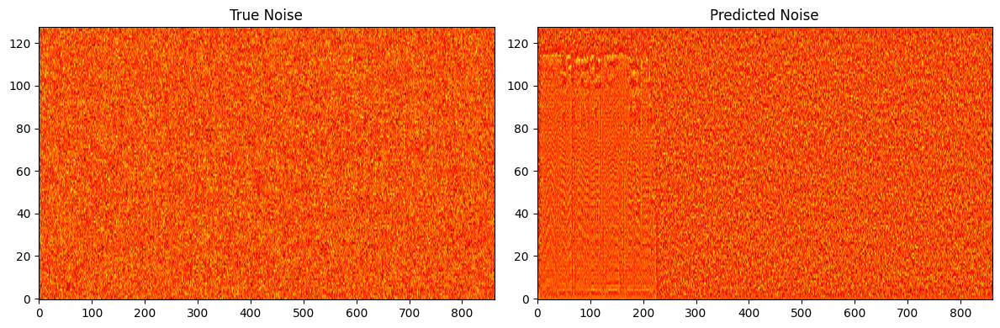

Training:  90%|█████████ | 90/100 [4:23:04<30:31, 183.11s/it]

Epoch 90/100 - Loss: 0.015117 - Val Loss: 0.028671


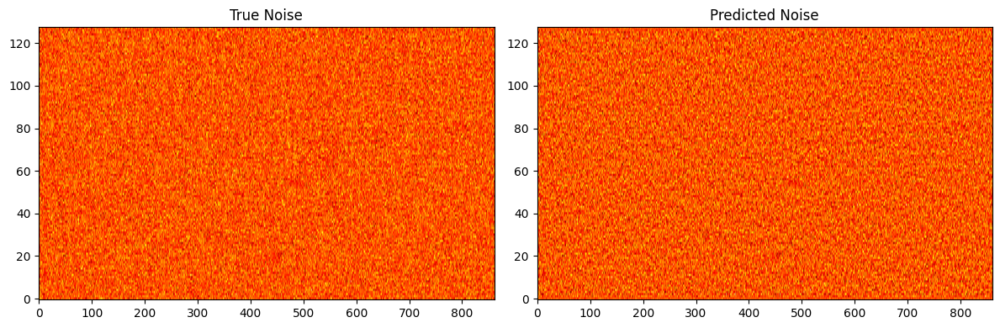

Training: 100%|██████████| 100/100 [4:52:44<00:00, 175.64s/it]


In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import torch.optim as optim
from tqdm import trange
import os
import matplotlib.pyplot as plt
from glob import glob
import random

# -------------------------------
# Mount Google Drive
# -------------------------------
from google.colab import drive

drive.mount('/content/drive')
save_dir = "/content/drive/MyDrive/diffusion_checkpoints"
os.makedirs(save_dir, exist_ok=True)

# -------------------------------
# Define the Diffusion Model
# -------------------------------
class DiffusionModel(nn.Module):
    def __init__(self, n_mels=128, input_length=861):
        super().__init__()

        self.time_mlp = nn.Sequential(
            nn.Linear(1, 256),
            nn.GELU(),
            nn.Linear(256, 256),
            nn.GELU(),
            nn.Linear(256, 256)
        )

        self.initial_conv = nn.Conv2d(1, 256, kernel_size=3, padding=1)
        self.down1 = nn.Sequential(
            nn.Conv2d(256, 256, kernel_size=3, stride=2, padding=1),
            nn.GroupNorm(8, 256),
            nn.GELU()
        )

        self.mid_conv = nn.Sequential(
            nn.Conv2d(256, 512, kernel_size=3, padding=1),
            nn.GroupNorm(8, 512),
            nn.GELU(),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            nn.GroupNorm(8, 512),
            nn.GELU()
        )

        self.up1 = nn.Sequential(
            nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2, output_padding=(0, 1)),
            nn.GroupNorm(8, 256),
            nn.GELU()
        )

        self.final_conv = nn.Sequential(
            nn.Conv2d(256, 64, kernel_size=3, padding=1),
            nn.GELU(),
            nn.Conv2d(64, 1, kernel_size=3, padding=1)
        )

    def forward(self, x, t):
        t_emb = self.time_mlp(t.unsqueeze(1).float())
        t_emb = t_emb.unsqueeze(-1).unsqueeze(-1)

        x = self.initial_conv(x)
        x = x + t_emb
        x = self.down1(x)
        x = self.mid_conv(x)
        x = self.up1(x)
        x = self.final_conv(x)

        return x

# -------------------------------
# Diffusion Noise Scheduler
# -------------------------------
def get_beta_schedule(timesteps, beta_start=1e-4, beta_end=0.02):
    return torch.linspace(beta_start, beta_end, timesteps)

class Diffusion:
    def __init__(self, timesteps=1000):
        self.timesteps = timesteps
        self.betas = get_beta_schedule(timesteps)
        self.alphas = 1. - self.betas
        self.alpha_hats = torch.cumprod(self.alphas, dim=0)

    def add_noise(self, x0, t, noise=None):
        if noise is None:
            noise = torch.randn_like(x0)
        sqrt_alpha_hat = torch.sqrt(self.alpha_hats[t])[:, None, None, None]
        sqrt_one_minus_alpha_hat = torch.sqrt(1 - self.alpha_hats[t])[:, None, None, None]
        return sqrt_alpha_hat * x0 + sqrt_one_minus_alpha_hat * noise, noise

# -------------------------------
# Setup
# -------------------------------
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = DiffusionModel().to(device)
diffusion = Diffusion(timesteps=1000)
optimizer = optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-3)

# -------------------------------
# Load training and validation data
# -------------------------------
data_dir = "/content/drive/MyDrive/deeplearning/mel_spectrograms/train"
val_data_dir = "/content/drive/MyDrive/deeplearning/mel_spectrograms/val"

file_paths = glob(os.path.join(data_dir, "*/*.npy"))
val_file_paths = glob(os.path.join(val_data_dir, "*/*.npy"))

valid_file_paths = [p for p in file_paths if np.load(p).shape[0] == 128 and np.load(p).shape[1] >= 861]
valid_val_paths = [p for p in val_file_paths if np.load(p).shape[0] == 128 and np.load(p).shape[1] >= 861]

print(f"Total training files: {len(valid_file_paths)}")
print(f"Total validation files: {len(valid_val_paths)}")

# -------------------------------
# Safe batch loader
# -------------------------------
def load_batch(paths, batch_size=4):
    batch = random.sample(paths, min(batch_size, len(paths)))
    tensors = []
    for path in batch:
        mel = np.load(path)
        if mel.shape[1] < 861:
            pad_width = 861 - mel.shape[1]
            mel = np.pad(mel, ((0, 0), (0, pad_width)))
        mel = mel[:, :861]
        tensors.append(torch.tensor(mel, dtype=torch.float32).unsqueeze(0))
    return torch.stack(tensors).to(device)

# -------------------------------
# Training Loop
# -------------------------------
num_epochs = 100
best_val_loss = float('inf')

for epoch in trange(num_epochs, desc="Training"):
    model.train()

    mel_input = load_batch(valid_file_paths, batch_size=6)
    t = torch.randint(0, diffusion.timesteps, (mel_input.size(0),)).to(device)
    x_noisy, true_noise = diffusion.add_noise(mel_input, t)
    t = t.float() / diffusion.timesteps

    noise_pred = model(x_noisy, t)
    noise_pred = noise_pred[..., :861]
    true_noise = true_noise[..., :861]

    loss = F.smooth_l1_loss(noise_pred, true_noise)

    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    model.eval()
    with torch.no_grad():
        val_input = load_batch(valid_val_paths, batch_size=4)
        t_val = torch.randint(0, diffusion.timesteps, (val_input.size(0),)).to(device)
        x_noisy_val, true_noise_val = diffusion.add_noise(val_input, t_val)
        t_val = t_val.float() / diffusion.timesteps

        pred_val = model(x_noisy_val, t_val)
        pred_val = pred_val[..., :861]
        true_noise_val = true_noise_val[..., :861]

        val_loss = F.smooth_l1_loss(pred_val, true_noise_val)

    if epoch % 10 == 0:
        print(f"Epoch {epoch}/{num_epochs} - Loss: {loss.item():.6f} - Val Loss: {val_loss.item():.6f}")
        with torch.no_grad():
            plt.figure(figsize=(12, 4))
            plt.subplot(1, 2, 1)
            plt.imshow(true_noise[0, 0].cpu().numpy(), aspect='auto', origin='lower', cmap='hot')
            plt.title("True Noise")
            plt.subplot(1, 2, 2)
            plt.imshow(noise_pred[0, 0].cpu().numpy(), aspect='auto', origin='lower', cmap='hot')
            plt.title("Predicted Noise")
            plt.tight_layout()
            plt.show()

    if val_loss.item() < best_val_loss:
        best_val_loss = val_loss.item()
        torch.save(model.state_dict(), f"{save_dir}/best_diffusion_model.pth")

    if epoch % 25 == 0 or epoch == num_epochs - 1:
        torch.save(model.state_dict(), f"{save_dir}/diffusion_model_epoch_{epoch}.pth")


In [8]:
import torch
import torch.nn as nn
import numpy as np
import matplotlib.pyplot as plt
from google.colab import drive

# Mount Google Drive (no need to remount if already mounted)
# drive.mount('/content/drive')

# Define the EXACT SAME model architecture as used during training
class DiffusionModel(nn.Module):
    def __init__(self, n_mels=128, input_length=861):
        super().__init__()

        self.time_mlp = nn.Sequential(
            nn.Linear(1, 256),
            nn.GELU(),
            nn.Linear(256, 256),
            nn.GELU(),
            nn.Linear(256, 256)
        )

        self.initial_conv = nn.Conv2d(1, 256, kernel_size=3, padding=1)
        self.down1 = nn.Sequential(
            nn.Conv2d(256, 256, kernel_size=3, stride=2, padding=1),
            nn.GroupNorm(8, 256),
            nn.GELU()
        )

        self.mid_conv = nn.Sequential(
            nn.Conv2d(256, 512, kernel_size=3, padding=1),
            nn.GroupNorm(8, 512),
            nn.GELU(),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            nn.GroupNorm(8, 512),
            nn.GELU()
        )

        self.up1 = nn.Sequential(
            nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2, output_padding=(0, 1)),
            nn.GroupNorm(8, 256),
            nn.GELU()
        )

        self.final_conv = nn.Sequential(
            nn.Conv2d(256, 64, kernel_size=3, padding=1),
            nn.GELU(),
            nn.Conv2d(64, 1, kernel_size=3, padding=1)
        )

    def forward(self, x, t):
        t_emb = self.time_mlp(t.unsqueeze(1).float())
        t_emb = t_emb.unsqueeze(-1).unsqueeze(-1)

        x = self.initial_conv(x)
        x = x + t_emb
        x = self.down1(x)
        x = self.mid_conv(x)
        x = self.up1(x)
        x = self.final_conv(x)

        return x

# Initialize model
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = DiffusionModel().to(device)

# Load the saved weights
model.load_state_dict(torch.load("/content/drive/MyDrive/diffusion_checkpoints/best_diffusion_model.pth"))
model.eval()  # Set to evaluation mode

print("Model loaded successfully!")

Model loaded successfully!


In [10]:
import torch

# First, define all the components exactly as they were during training
def get_beta_schedule(timesteps, beta_start=1e-4, beta_end=0.02):
    return torch.linspace(beta_start, beta_end, timesteps)

class Diffusion:
    def __init__(self, timesteps=1000, device='cpu'):
        self.timesteps = timesteps
        self.device = device  # Store device
        self.betas = get_beta_schedule(timesteps).to(device)  # Ensure betas are on the right device
        self.alphas = 1. - self.betas
        self.alpha_hats = torch.cumprod(self.alphas, dim=0).to(device)  # Move alpha_hats to the same device

    def add_noise(self, x0, t, noise=None):
        if noise is None:
            noise = torch.randn_like(x0)

        # Ensure t is on the same device as alpha_hats
        t = t.to(self.device)

        sqrt_alpha_hat = torch.sqrt(self.alpha_hats[t])[:, None, None, None]
        sqrt_one_minus_alpha_hat = torch.sqrt(1 - self.alpha_hats[t])[:, None, None, None]
        return sqrt_alpha_hat * x0 + sqrt_one_minus_alpha_hat * noise, noise

# Initialize device (use cuda if available)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Initialize diffusion with the correct device
diffusion = Diffusion(timesteps=1000, device=device)  # Must match your training timesteps

# Example input, replace with your actual mel spectrogram
mel_tensor = torch.randn(1, 1, 128, 861).to(device)

t = torch.randint(0, diffusion.timesteps, (1,)).to(device)  # Random timestep
x_noisy, true_noise = diffusion.add_noise(mel_tensor, t)
t_normalized = t.float() / diffusion.timesteps

# Verify shapes
print(f"Noisy mel shape: {x_noisy.shape}")  # Should be [1, 1, 128, 861]
print(f"Noise shape: {true_noise.shape}")   # Should be [1, 1, 128, 861]
print(f"Timestep: {t.item()} (normalized: {t_normalized.item()})")


Noisy mel shape: torch.Size([1, 1, 128, 861])
Noise shape: torch.Size([1, 1, 128, 861])
Timestep: 211 (normalized: 0.2110000103712082)


In [17]:
import numpy as np

# Load mel-spectrogram and convert to torch tensor
mel_path = "/content/drive/MyDrive/deeplearning/mel_spectrograms/val/angry/emodb_03a02Wc.npy"
mel_np = np.load(mel_path)

# Ensure correct shape: [B, C, F, T] = [1, 1, 128, 861]
mel_tensor = torch.tensor(mel_np, dtype=torch.float32).unsqueeze(0).unsqueeze(0).to(device)


In [18]:
# Random timestep
t = torch.randint(0, diffusion.timesteps, (1,)).to(device)
x_noisy, true_noise = diffusion.add_noise(mel_tensor, t)
t = t.float() / diffusion.timesteps


In [19]:
model.eval()
with torch.no_grad():
    predicted_noise = model(x_noisy, t)

    # Crop to fix size mismatch
    min_width = min(predicted_noise.shape[-1], true_noise.shape[-1])
    predicted_noise = predicted_noise[..., :min_width]
    true_noise = true_noise[..., :min_width]
    x_denoised = x_noisy[..., :min_width] - predicted_noise


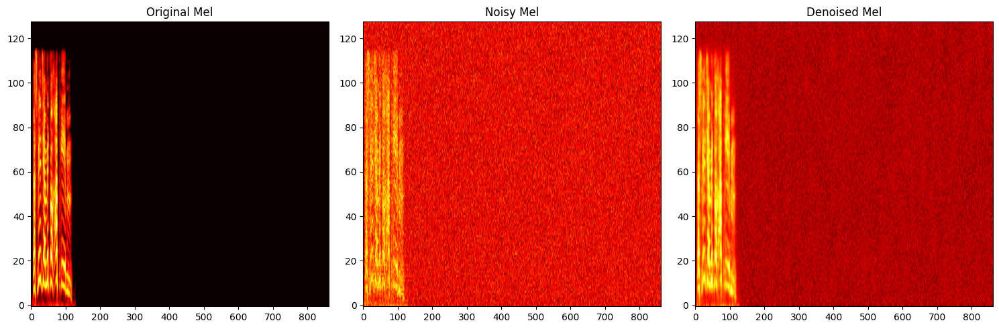

In [20]:
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(mel_tensor[0, 0].cpu().numpy(), aspect='auto', origin='lower', cmap='hot')
plt.title("Original Mel")

plt.subplot(1, 3, 2)
plt.imshow(x_noisy[0, 0].cpu().numpy(), aspect='auto', origin='lower', cmap='hot')
plt.title("Noisy Mel")

plt.subplot(1, 3, 3)
plt.imshow(x_denoised[0, 0].cpu().numpy(), aspect='auto', origin='lower', cmap='hot')
plt.title("Denoised Mel")

plt.tight_layout()
plt.show()


In [22]:
@torch.no_grad()
def sample(model, diffusion, shape, device):
    model.eval()
    x = torch.randn(shape).to(device)

    for t in reversed(range(diffusion.timesteps)):
        t_tensor = torch.tensor([t / diffusion.timesteps], device=device).repeat(shape[0])
        predicted_noise = model(x, t_tensor)

        # Match predicted_noise shape to x if needed
        if predicted_noise.shape[-1] > x.shape[-1]:
            predicted_noise = predicted_noise[..., :x.shape[-1]]
        elif predicted_noise.shape[-1] < x.shape[-1]:
            pad_width = x.shape[-1] - predicted_noise.shape[-1]
            predicted_noise = F.pad(predicted_noise, (0, pad_width))

        beta_t = diffusion.betas[t]
        alpha_t = diffusion.alphas[t]
        alpha_hat_t = diffusion.alpha_hats[t]

        noise = torch.randn_like(x) if t > 0 else 0
        x = (1 / torch.sqrt(alpha_t) * (x - (1 - alpha_t) / torch.sqrt(1 - alpha_hat_t) * predicted_noise)
             + torch.sqrt(beta_t) * noise)

    return x
generated = sample(model, diffusion, shape=(4, 1, 128, 861), device=device)
np.save("/content/drive/MyDrive/deeplearning/generated_mel_0.npy", generated[0].cpu().numpy())


In [12]:
pip install tqdm


In [13]:
import torch
import torch.nn.functional as F
import numpy as np
from tqdm import tqdm  # Import tqdm for the progress bar

# Define the sampling function
@torch.no_grad()
def sample(model, diffusion, shape, device):
    model.eval()
    x = torch.randn(shape).to(device)

    for t in reversed(range(diffusion.timesteps)):
        t_tensor = torch.tensor([t / diffusion.timesteps], device=device).repeat(shape[0])
        predicted_noise = model(x, t_tensor)

        # Match predicted_noise shape to x if needed
        if predicted_noise.shape[-1] > x.shape[-1]:
            predicted_noise = predicted_noise[..., :x.shape[-1]]
        elif predicted_noise.shape[-1] < x.shape[-1]:
            pad_width = x.shape[-1] - predicted_noise.shape[-1]
            predicted_noise = F.pad(predicted_noise, (0, pad_width))

        beta_t = diffusion.betas[t]
        alpha_t = diffusion.alphas[t]
        alpha_hat_t = diffusion.alpha_hats[t]

        noise = torch.randn_like(x) if t > 0 else 0
        x = (1 / torch.sqrt(alpha_t) * (x - (1 - alpha_t) / torch.sqrt(1 - alpha_hat_t) * predicted_noise)
             + torch.sqrt(beta_t) * noise)

    return x

# Assuming the model, diffusion, and device are already defined
# Generate 100 spectrograms using the diffusion model
num_samples = 100
generated_spectrograms = []

# Add tqdm to the loop for a progress bar
for _ in tqdm(range(num_samples), desc="Generating Spectrograms", ncols=100):
    generated = sample(model, diffusion, shape=(1, 1, 128, 861), device=device)  # Generate a single spectrogram
    generated_spectrograms.append(generated)

# Convert list to tensor (batch of spectrograms)
generated_spectrograms = torch.cat(generated_spectrograms, dim=0)  # Shape: [100, 1, 128, 861]

# Optionally save generated spectrograms
np.save("/content/drive/MyDrive/deeplearning/generated_mels_100.npy", generated_spectrograms.cpu().numpy())

Generating Spectrograms: 100%|██████████████████████████████████| 100/100 [1:59:00<00:00, 71.41s/it]


NameError: name 'vae_enhance_spectrograms' is not defined

Shape of loaded spectrograms: (100, 1, 128, 861)


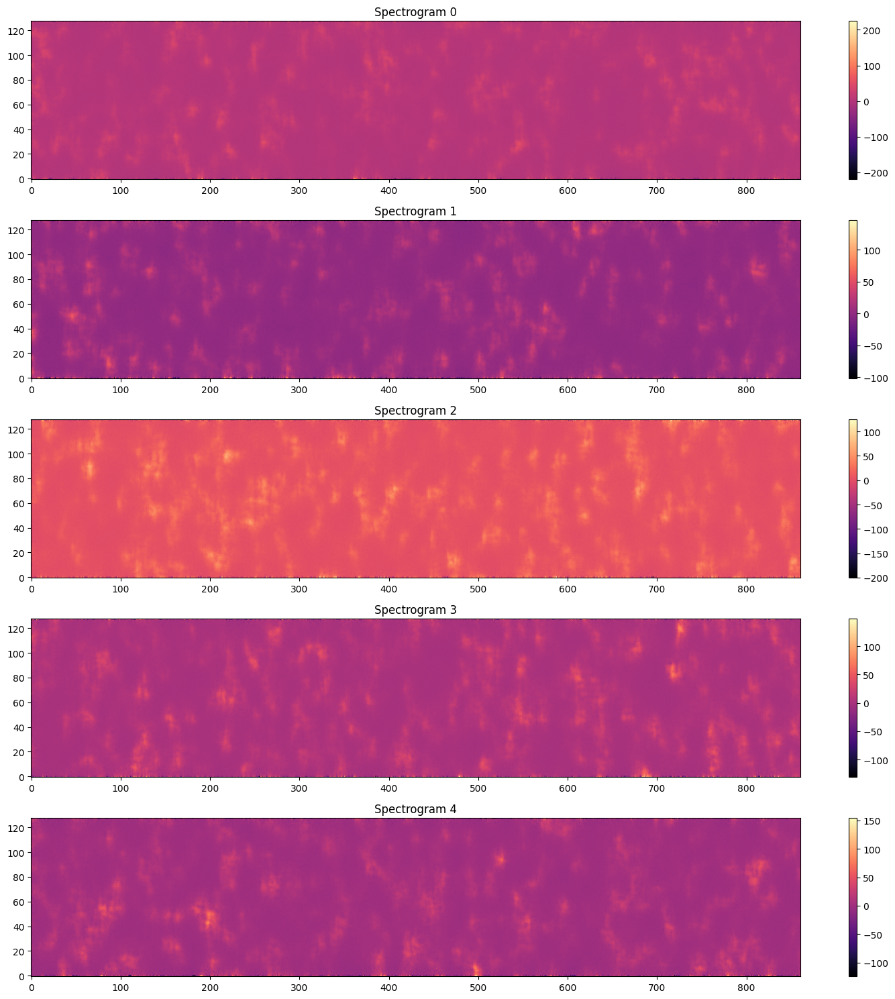

In [3]:
import numpy as np
import matplotlib.pyplot as plt

# Load the generated spectrograms
generated_mels = np.load("/content/drive/MyDrive/deeplearning/generated_mels_100.npy")

# Check the shape (should be [100, 1, 128, 861])
print("Shape of loaded spectrograms:", generated_mels.shape)

# Remove the channel dimension for visualization
# Resulting shape: [100, 128, 861]
spectrograms = generated_mels[:, 0, :, :]

# Function to plot one or more spectrograms
def plot_spectrograms(specs, num=5):
    plt.figure(figsize=(15, 3 * num))
    for i in range(num):
        plt.subplot(num, 1, i + 1)
        plt.imshow(specs[i], origin='lower', aspect='auto', cmap='magma')
        plt.colorbar()
        plt.title(f"Spectrogram {i}")
    plt.tight_layout()
    plt.show()

# Plot the first 5 spectrograms
plot_spectrograms(spectrograms, num=5)


In [1]:
def vae_enhance_spectrograms(vae, spectrograms, device):
    """
    Use VAE to enhance emotional characteristics in spectrograms that were
    already generated by a diffusion model.

    Args:
        vae: Trained EmotionVAE model
        spectrograms: Batch of spectrograms [B, 1, 128, 861] from diffusion model
        device: Device to run inference on (cuda/cpu)

    Returns:
        Enhanced spectrograms with same shape as input
    """
    vae.eval()
    with torch.no_grad():
        spectrograms = spectrograms.to(device)

        # Encode to latent space
        mu, logvar = vae.encode(spectrograms)

        # Sample from latent space
        z = vae.reparameterize(mu, logvar)

        # Enhance emotional features by moving latent vector further from mean
        # This emphasizes the emotional characteristics
        emotion_enhancement_factor = 1.2  # Tune this value based on results
        z_enhanced = mu + (z - mu) * emotion_enhancement_factor

        # Decode enhanced latent representation
        enhanced_spectrograms = vae.decode(z_enhanced)

        return enhanced_spectrograms

In [14]:
import torch.nn as nn
import torch.nn.functional as F

class EmotionVAE(nn.Module):
    def __init__(self, latent_dim=64):
        super(EmotionVAE, self).__init__()
        self.latent_dim = latent_dim
        self.input_dim = 1 * 128 * 861  # Match your spectrogram shape

        # Encoder
        self.fc1 = nn.Linear(self.input_dim, 1024)
        self.fc_mu = nn.Linear(1024, latent_dim)
        self.fc_logvar = nn.Linear(1024, latent_dim)

        # Decoder
        self.fc2 = nn.Linear(latent_dim, 1024)
        self.fc3 = nn.Linear(1024, self.input_dim)

    def encode(self, x):
        x = x.view(x.size(0), -1)
        h = F.relu(self.fc1(x))
        mu = self.fc_mu(h)
        logvar = self.fc_logvar(h)
        return mu, logvar

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def decode(self, z):
        h = F.relu(self.fc2(z))
        out = torch.sigmoid(self.fc3(h))
        return out.view(-1, 1, 128, 861)

    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        recon = self.decode(z)
        return recon, mu, logvar


In [12]:
generated_mels = np.load("/content/drive/MyDrive/deeplearning/generated_mels_100.npy")
generated_mels_tensor = torch.tensor(generated_mels, dtype=torch.float32)


In [16]:
vae = EmotionVAE(latent_dim=64).to(device)
optimizer = torch.optim.Adam(vae.parameters(), lr=1e-3)

def loss_fn(x, x_recon, mu, logvar):
    recon_loss = F.mse_loss(x_recon, x, reduction='sum')
    kl_div = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
    return recon_loss + kl_div

# Training loop

epochs = 50
batch_size = 10

# Normalize before training
generated_mels_tensor = (generated_mels_tensor - generated_mels_tensor.min()) / (generated_mels_tensor.max() - generated_mels_tensor.min())

optimizer = torch.optim.Adam(vae.parameters(), lr=1e-4)  # lower LR
vae.train()

for epoch in range(epochs):
    perm = torch.randperm(len(generated_mels_tensor))
    total_loss = 0

    for i in range(0, len(generated_mels_tensor), batch_size):
        indices = perm[i:i+batch_size]
        batch = generated_mels_tensor[indices].to(device)

        optimizer.zero_grad()
        recon, mu, logvar = vae(batch)
        loss = loss_fn(batch, recon, mu, logvar)

        if torch.isnan(loss):
            print("NaN loss encountered — breaking training.")
            break

        loss.backward()
        torch.nn.utils.clip_grad_norm_(vae.parameters(), max_norm=1.0)
        optimizer.step()
        total_loss += loss.item()

    print(f"Epoch {epoch+1}/{epochs}, Loss: {total_loss:.2f}")


# Save the trained VAE model
torch.save(vae.state_dict(), "/content/drive/MyDrive/deeplearning/vae_trained.pth")


Epoch 1/50, Loss: 58546.99
Epoch 2/50, Loss: 19463.65
Epoch 3/50, Loss: 12579.01
Epoch 4/50, Loss: 10617.41
Epoch 5/50, Loss: 9680.72
Epoch 6/50, Loss: 9377.21
Epoch 7/50, Loss: 8996.02
Epoch 8/50, Loss: 9050.78
Epoch 9/50, Loss: 8669.82
Epoch 10/50, Loss: 8570.69
Epoch 11/50, Loss: 8227.75
Epoch 12/50, Loss: 8266.58
Epoch 13/50, Loss: 7954.29
Epoch 14/50, Loss: 7611.15
Epoch 15/50, Loss: 7369.93
Epoch 16/50, Loss: 7234.95
Epoch 17/50, Loss: 7087.44
Epoch 18/50, Loss: 6762.49
Epoch 19/50, Loss: 6617.61
Epoch 20/50, Loss: 6633.14
Epoch 21/50, Loss: 6404.10
Epoch 22/50, Loss: 6191.56
Epoch 23/50, Loss: 5802.36
Epoch 24/50, Loss: 5764.81
Epoch 25/50, Loss: 5529.11
Epoch 26/50, Loss: 5413.89
Epoch 27/50, Loss: 5424.32
Epoch 28/50, Loss: 5161.63
Epoch 29/50, Loss: 5133.30
Epoch 30/50, Loss: 4997.28
Epoch 31/50, Loss: 5001.56
Epoch 32/50, Loss: 4903.46
Epoch 33/50, Loss: 4773.02
Epoch 34/50, Loss: 4593.46
Epoch 35/50, Loss: 4560.35
Epoch 36/50, Loss: 4422.54
Epoch 37/50, Loss: 4471.01
Epoch 

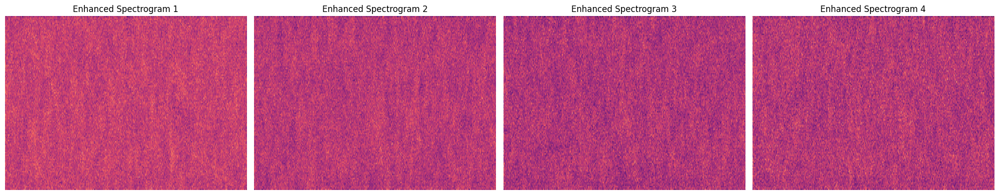

In [20]:
import torch
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt

# Assume EmotionVAE class is defined
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load trained VAE model
vae = EmotionVAE(latent_dim=64).to(device)
vae.load_state_dict(torch.load("/content/drive/MyDrive/deeplearning/vae_trained.pth"))
vae.eval()

# Take first 4 spectrograms and normalize like during training
test_spectrograms = generated_mels_tensor[:4]
test_spectrograms = (test_spectrograms - test_spectrograms.min()) / (test_spectrograms.max() - test_spectrograms.min())
test_spectrograms = test_spectrograms.to(device)

with torch.no_grad():
    mu, logvar = vae.encode(test_spectrograms)
    z = vae.reparameterize(mu, logvar)
    z_enhanced = mu + (z - mu) * 1.2  # Enhancement factor
    enhanced_spectrograms = vae.decode(z_enhanced)

# Convert to CPU for visualization
enhanced_spectrograms = enhanced_spectrograms.cpu().numpy()

# Plot 4 enhanced spectrograms
fig, axs = plt.subplots(1, 4, figsize=(20, 4))
for i in range(4):
    spec = enhanced_spectrograms[i][0]  # shape: [1, 128, 861]
    axs[i].imshow(spec, aspect='auto', origin='lower', cmap='magma')
    axs[i].set_title(f"Enhanced Spectrogram {i+1}")
    axs[i].axis('off')

plt.tight_layout()
plt.show()


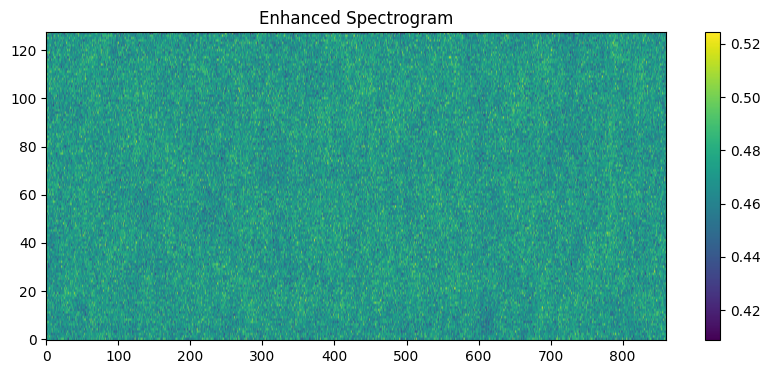

In [19]:
import matplotlib.pyplot as plt

# Take the first enhanced spectrogram (1, 128, 861)
spec = enhanced_spectrograms[0].cpu().squeeze(0).numpy()

plt.figure(figsize=(10, 4))
plt.imshow(spec, aspect='auto', origin='lower')
plt.colorbar()
plt.title("Enhanced Spectrogram")
plt.show()


In [17]:
# Load the generated spectrograms if not already in memory
import numpy as np
import torch

generated_mels = np.load("/content/drive/MyDrive/deeplearning/generated_mels_100.npy")  # shape: [100, 1, 128, 861]
generated_mels_tensor = torch.tensor(generated_mels, dtype=torch.float32)

# Apply the VAE enhancement
enhanced_spectrograms = vae_enhance_spectrograms(vae, generated_mels_tensor, device)

# Save the enhanced spectrograms
np.save("/content/drive/MyDrive/deeplearning/enhanced_mels_100.npy", enhanced_spectrograms.cpu().numpy())


In [23]:
import numpy as np
import os

# Ensure output directory exists
output_dir = "/content/drive/MyDrive/deeplearning/generated_batch"
os.makedirs(output_dir, exist_ok=True)

# Save all generated spectrograms
for i in range(generated.shape[0]):
    mel = generated[i, 0].cpu().numpy()
    np.save(os.path.join(output_dir, f"generated_mel_{i}.npy"), mel)

print("✅ All generated mel-spectrograms saved as .npy files.")


✅ All generated mel-spectrograms saved as .npy files.


<ipython-input-24-aa58e27777d7>:32: UserWarning: Glyph 127911 (\N{HEADPHONE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-24-aa58e27777d7>:32: UserWarning: Glyph 129514 (\N{TEST TUBE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127911 (\N{HEADPHONE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129514 (\N{TEST TUBE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


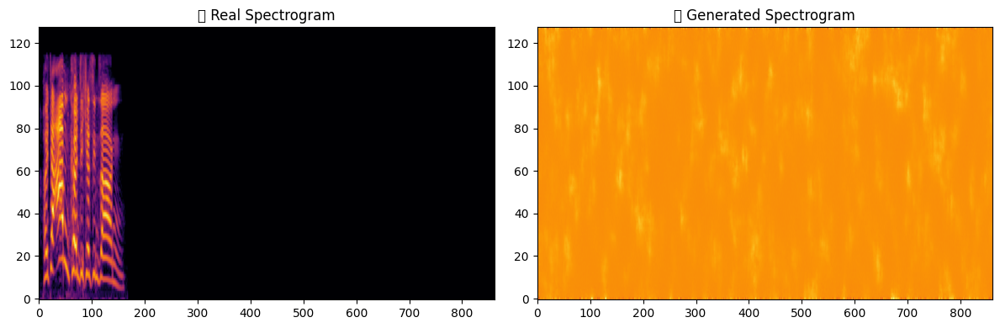

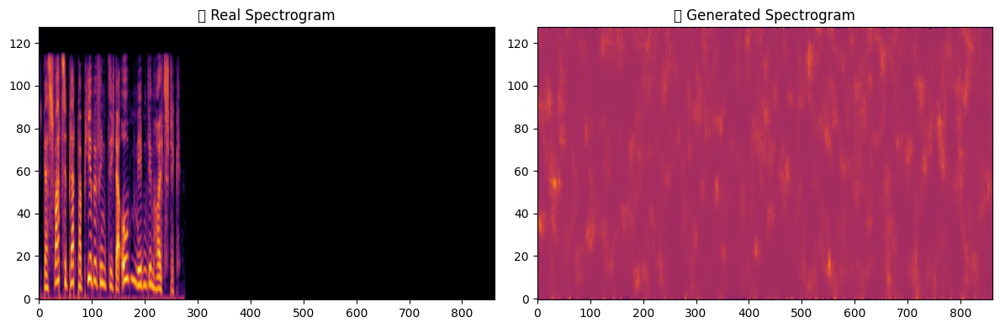

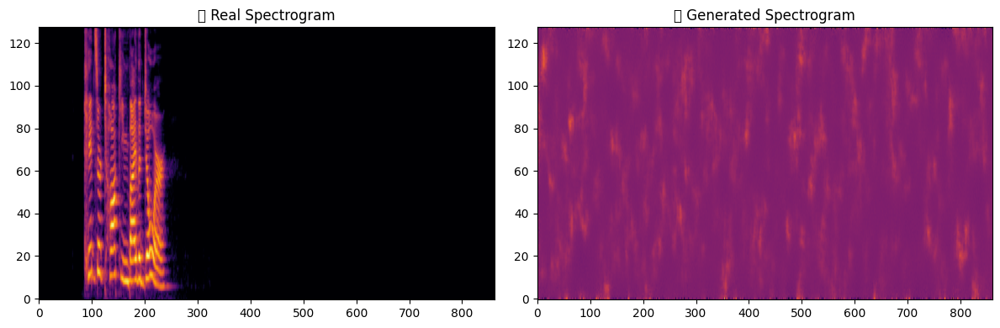

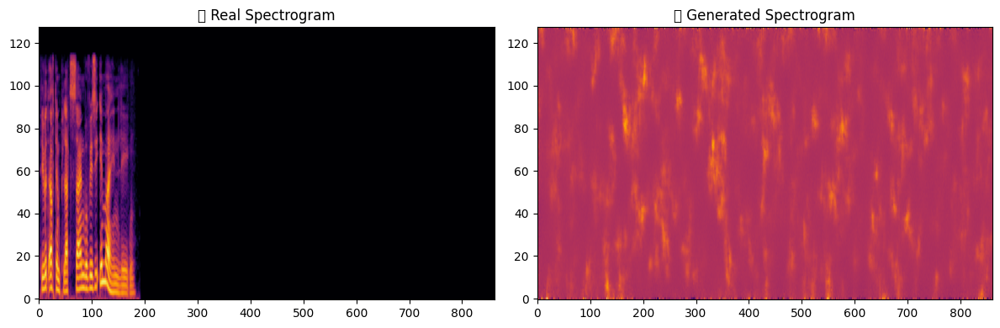

In [24]:
import numpy as np
import matplotlib.pyplot as plt
import glob
import random
import os

# -------------------------------
# Paths
# -------------------------------
real_dir = "/content/drive/MyDrive/deeplearning/mel_spectrograms/val"
gen_dir = "/content/drive/MyDrive/deeplearning/generated_batch"

# Load real spectrograms
real_paths = glob.glob(os.path.join(real_dir, "*/*.npy"))
random.shuffle(real_paths)  # shuffle to get random ones
real_specs = [np.load(p)[:, :861] for p in real_paths[:4]]  # trim if needed

# Load generated spectrograms
gen_specs = [np.load(os.path.join(gen_dir, f"generated_mel_{i}.npy")) for i in range(4)]

# -------------------------------
# Plot real vs generated
# -------------------------------
for i in range(4):
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(real_specs[i], aspect='auto', origin='lower', cmap='inferno')
    plt.title("🎧 Real Spectrogram")
    plt.subplot(1, 2, 2)
    plt.imshow(gen_specs[i], aspect='auto', origin='lower', cmap='inferno')
    plt.title("🧪 Generated Spectrogram")
    plt.tight_layout()
    plt.show()


In [25]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class EmotionResNet(nn.Module):
    def __init__(self, num_classes=7):
        super(EmotionResNet, self).__init__()

        self.layer1 = nn.Sequential(
            nn.Conv2d(1, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2)
        )

        self.layer2 = nn.Sequential(
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2)
        )

        self.layer3 = nn.Sequential(
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.AdaptiveAvgPool2d((1, 1))
        )

        self.fc = nn.Sequential(
            nn.Flatten(),
            nn.Linear(256, 128),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(128, num_classes)
        )

    def forward(self, x):
        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.fc(x)
        return x

# Example usage:
if __name__ == "__main__":
    model = EmotionResNet(num_classes=7)
    dummy_input = torch.randn(4, 1, 128, 861)
    output = model(dummy_input)
    print("Output shape:", output.shape)  # Expected: (4, 7)


Output shape: torch.Size([4, 7])


In [26]:
from torch.utils.data import Dataset
import numpy as np
import os
import glob

class MelSpectrogramDataset(Dataset):
    def __init__(self, root_dir, label_map):
        self.samples = []
        self.labels = []
        self.label_map = label_map
        for label_name in os.listdir(root_dir):
            full_path = os.path.join(root_dir, label_name)
            if os.path.isdir(full_path):
                label = label_map[label_name]
                for npy_file in glob.glob(os.path.join(full_path, "*.npy")):
                    self.samples.append(npy_file)
                    self.labels.append(label)

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        x = np.load(self.samples[idx])
        if x.shape[1] < 861:
            pad_width = 861 - x.shape[1]
            x = np.pad(x, ((0, 0), (0, pad_width)))
        x = x[:, :861]
        x = torch.tensor(x, dtype=torch.float32).unsqueeze(0)  # Shape: (1, 128, 861)
        y = self.labels[idx]
        return x, y


In [27]:
label_map = {
    'angry': 0,
    'disgust': 1,
    'fear': 2,
    'happy': 3,
    'neutral': 4,
    'sad': 5,
    'surprised': 6
}


In [2]:
class CachedMelDataset(Dataset):
    def __init__(self, root_dir, label_map):
        self.data = []
        for label_name, label_idx in label_map.items():
            folder = os.path.join(root_dir, label_name)
            files = glob.glob(os.path.join(folder, "*.npy"))
            for f in files:
                mel = np.load(f)
                if mel.shape[1] < 861:
                    pad_width = 861 - mel.shape[1]
                    mel = np.pad(mel, ((0, 0), (0, pad_width)))
                mel = mel[:, :861]
                mel_tensor = torch.tensor(mel, dtype=torch.float32).unsqueeze(0)
                self.data.append((mel_tensor, label_idx))

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        return self.data[idx]


In [26]:
os.makedirs("/content/drive/MyDrive/deeplearning/models", exist_ok=True)


In [1]:
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import torchaudio.transforms as T
import numpy as np
import os
import glob
import copy
from datetime import datetime

# -------------------------------
# Cached Dataset with Augmentation
# -------------------------------
class CachedMelDataset(Dataset):
    def __init__(self, root_dir, label_map, augment=False):
        self.data = []
        self.augment = augment
        self.augmentations = nn.Sequential(
            T.FrequencyMasking(freq_mask_param=15),
            T.TimeMasking(time_mask_param=20),
        )
        for label_name, label_idx in label_map.items():
            folder = os.path.join(root_dir, label_name)
            files = glob.glob(os.path.join(folder, "*.npy"))
            for f in files:
                mel = np.load(f)
                if mel.shape[1] < 861:
                    pad_width = 861 - mel.shape[1]
                    mel = np.pad(mel, ((0, 0), (0, pad_width)))
                mel = mel[:, :861]
                mel_tensor = torch.tensor(mel, dtype=torch.float32).unsqueeze(0)
                self.data.append((mel_tensor, label_idx))

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        mel_tensor, label = self.data[idx]
        if self.augment:
            mel_tensor = self.augmentations(mel_tensor)
        return mel_tensor, label

# -------------------------------
# Improved Model with Extra Layer and Higher Dropout
# -------------------------------
class EmotionResNet(nn.Module):
    def __init__(self, num_classes=7):
        super().__init__()
        self.layer1 = nn.Sequential(
            nn.Conv2d(1, 64, 3, 1, 1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(2, 2))
        self.layer2 = nn.Sequential(
            nn.Conv2d(64, 128, 3, 1, 1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(2, 2))
        self.layer3 = nn.Sequential(
            nn.Conv2d(128, 256, 3, 1, 1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.MaxPool2d(2, 2))
        self.layer4 = nn.Sequential(
            nn.Conv2d(256, 512, 3, 1, 1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.AdaptiveAvgPool2d((1, 1)))
        self.fc = nn.Sequential(
            nn.Flatten(),
            nn.Linear(512, 256),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(256, num_classes))

    def forward(self, x):
        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)
        return self.fc(x)

# -------------------------------
# Training Loop with Scheduler and Weight Decay
# -------------------------------
def train(model, train_loader, val_loader, device, save_path, epochs=60, patience=7):
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-4, weight_decay=1e-5)
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', patience=3, factor=0.5, verbose=True)
    model.to(device)

    best_model = None
    best_val_acc = 0.0
    patience_counter = 0

    for epoch in range(epochs):
        model.train()
        running_loss, correct, total = 0.0, 0, 0
        for inputs, labels in train_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            loss = criterion(outputs, labels)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            running_loss += loss.item() * inputs.size(0)
            _, preds = torch.max(outputs, 1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

        train_acc = correct / total
        val_acc, val_loss = evaluate(model, val_loader, device, criterion)
        scheduler.step(val_acc)

        print(f"Epoch {epoch+1}/{epochs} | Train Loss: {running_loss/total:.4f} | Train Acc: {train_acc:.4f} | Val Loss: {val_loss:.4f} | Val Acc: {val_acc:.4f}")

        if val_acc > best_val_acc:
            best_val_acc = val_acc
            best_model = copy.deepcopy(model.state_dict())
            patience_counter = 0
        else:
            patience_counter += 1
            if patience_counter >= patience:
                print(f"Early stopping triggered at epoch {epoch+1}.")
                break

    if best_model is not None:
        model.load_state_dict(best_model)
        print(f"Loaded best model with Val Acc: {best_val_acc:.4f}")
        torch.save(best_model, save_path)
        print(f"Best model saved to: {save_path}")

def evaluate(model, dataloader, device, criterion):
    model.eval()
    total, correct, val_loss = 0, 0, 0.0
    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            val_loss += loss.item() * inputs.size(0)
            _, preds = torch.max(outputs, 1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)
    return correct / total, val_loss / total

# -------------------------------
# Main
# -------------------------------
if __name__ == "__main__":
    label_map = {
        'angry': 0, 'disgust': 1, 'fear': 2,
        'happy': 3, 'neutral': 4, 'sad': 5, 'surprised': 6
    }

    train_dir = "/content/drive/MyDrive/deeplearning/mel_spectrograms/train"
    val_dir = "/content/drive/MyDrive/deeplearning/mel_spectrograms/val"

    train_dataset = CachedMelDataset(train_dir, label_map, augment=True)
    val_dataset = CachedMelDataset(val_dir, label_map, augment=False)

    train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=8, shuffle=False)

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = EmotionResNet(num_classes=7)

    # Save path in Google Drive
    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
    save_path = f"/content/drive/MyDrive/deeplearning/models/emotion_model_{timestamp}.pt"

    # Train and save
    train(model, train_loader, val_loader, device, save_path, epochs=60, patience=7)


/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Epoch 1/60 | Train Loss: 1.8765 | Train Acc: 0.2330 | Val Loss: 1.8630 | Val Acc: 0.2556
Epoch 2/60 | Train Loss: 1.7749 | Train Acc: 0.3150 | Val Loss: 1.7590 | Val Acc: 0.2907
Epoch 3/60 | Train Loss: 1.7146 | Train Acc: 0.3308 | Val Loss: 1.6615 | Val Acc: 0.3534
Epoch 4/60 | Train Loss: 1.6593 | Train Acc: 0.3378 | Val Loss: 1.8061 | Val Acc: 0.2105
Epoch 5/60 | Train Loss: 1.6049 | Train Acc: 0.3567 | Val Loss: 1.6912 | Val Acc: 0.3358
Epoch 6/60 | Train Loss: 1.5787 | Train Acc: 0.3769 | Val Loss: 1.5441 | Val Acc: 0.3835
Epoch 7/60 | Train Loss: 1.5529 | Train Acc: 0.3996 | Val Loss: 1.4879 | Val Acc: 0.3985
Epoch 8/60 | Train Loss: 1.5374 | Train Acc: 0.4116 | Val Loss: 1.4325 | Val Acc: 0.4185
Epoch 9/60 | Train Loss: 1.4912 | Train Acc: 0.4268 | Val Loss: 2.1309 | Val Acc: 0.2581
Epoch 10/60 | Train Loss: 1.4918 | Train Acc: 0.4192 | Val Loss: 2.4867 | Val Acc: 0.2306
Epoch 11/60 | Train Loss: 1.4676 | Train Acc: 0.4331 | Val Loss: 1.4649 | Val Acc: 0.4035
Epoch 12/60 | Train

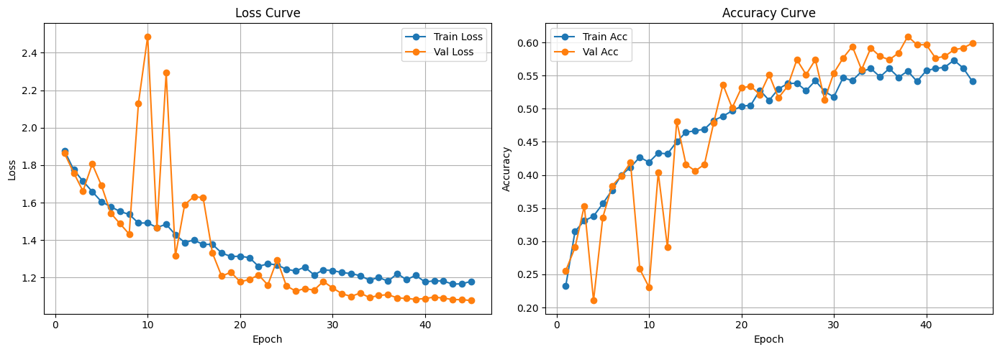

In [5]:
import matplotlib.pyplot as plt

# Manually extracted logs from your output
train_loss = [
    1.8765, 1.7749, 1.7146, 1.6593, 1.6049, 1.5787, 1.5529, 1.5374, 1.4912, 1.4918,
    1.4676, 1.4846, 1.4289, 1.3874, 1.4003, 1.3769, 1.3779, 1.3317, 1.3126, 1.3144,
    1.3067, 1.2600, 1.2740, 1.2679, 1.2449, 1.2356, 1.2564, 1.2146, 1.2415, 1.2379,
    1.2273, 1.2216, 1.2106, 1.1863, 1.2012, 1.1808, 1.2214, 1.1889, 1.2125, 1.1771,
    1.1830, 1.1817, 1.1655, 1.1671, 1.1804
]
train_acc = [
    0.2330, 0.3150, 0.3308, 0.3378, 0.3567, 0.3769, 0.3996, 0.4116, 0.4268, 0.4192,
    0.4331, 0.4318, 0.4501, 0.4646, 0.4665, 0.4691, 0.4823, 0.4886, 0.4968, 0.5038,
    0.5051, 0.5278, 0.5126, 0.5297, 0.5379, 0.5385, 0.5271, 0.5423, 0.5259, 0.5177,
    0.5467, 0.5423, 0.5562, 0.5606, 0.5480, 0.5606, 0.5473, 0.5568, 0.5410, 0.5574,
    0.5606, 0.5625, 0.5732, 0.5612, 0.5410
]
val_loss = [
    1.8630, 1.7590, 1.6615, 1.8061, 1.6912, 1.5441, 1.4879, 1.4325, 2.1309, 2.4867,
    1.4649, 2.2924, 1.3155, 1.5891, 1.6321, 1.6264, 1.3319, 1.2079, 1.2287, 1.1780,
    1.1897, 1.2145, 1.1609, 1.2950, 1.1568, 1.1283, 1.1413, 1.1335, 1.1798, 1.1454,
    1.1147, 1.0997, 1.1180, 1.0937, 1.1050, 1.1091, 1.0922, 1.0888, 1.0845, 1.0885,
    1.0962, 1.0908, 1.0831, 1.0824, 1.0779
]
val_acc = [
    0.2556, 0.2907, 0.3534, 0.2105, 0.3358, 0.3835, 0.3985, 0.4185, 0.2581, 0.2306,
    0.4035, 0.2907, 0.4812, 0.4160, 0.4060, 0.4160, 0.4787, 0.5363, 0.5013, 0.5313,
    0.5338, 0.5213, 0.5514, 0.5163, 0.5338, 0.5739, 0.5514, 0.5739, 0.5138, 0.5539,
    0.5764, 0.5940, 0.5589, 0.5915, 0.5789, 0.5739, 0.5840, 0.6090, 0.5965, 0.5965,
    0.5764, 0.5789, 0.5890, 0.5915, 0.5990
]

epochs = range(1, len(train_loss) + 1)

# Plotting
plt.figure(figsize=(14, 5))

# Loss Curve
plt.subplot(1, 2, 1)
plt.plot(epochs, train_loss, label='Train Loss', marker='o')
plt.plot(epochs, val_loss, label='Val Loss', marker='o')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss Curve')
plt.legend()
plt.grid(True)

# Accuracy Curve
plt.subplot(1, 2, 2)
plt.plot(epochs, train_acc, label='Train Acc', marker='o')
plt.plot(epochs, val_acc, label='Val Acc', marker='o')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy Curve')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


In [23]:
import torch
from torch.utils.data import DataLoader
import os
from datetime import datetime

# Assuming these are already defined earlier in your script
# CachedMelDataset, EmotionResNet, label_map

# -------------------------------
# Load and Evaluate on Test Data
# -------------------------------

def test_model(model_path, test_dir, label_map):
    # Load test dataset
    test_dataset = CachedMelDataset(test_dir, label_map, augment=False)
    test_loader = DataLoader(test_dataset, batch_size=8, shuffle=False)

    # Setup device and model
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = EmotionResNet(num_classes=len(label_map))
    model.load_state_dict(torch.load(model_path, map_location=device))
    model.to(device)
    model.eval()

    # Evaluate
    correct, total = 0, 0
    predictions, ground_truths = [], []

    with torch.no_grad():
        for inputs, labels in test_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)
            predictions.extend(preds.cpu().numpy())
            ground_truths.extend(labels.cpu().numpy())

    accuracy = correct / total
    print(f"Test Accuracy: {accuracy:.4f}")

    return predictions, ground_truths

# -------------------------------
# Run Test
# -------------------------------

if __name__ == "__main__":
    model_path = "/content/drive/MyDrive/deeplearning/models/emotion_model_20250514_210203.pt"
    test_dir = "/content/drive/MyDrive/deeplearning/mel_spectrograms/val"  # Adjust if needed

    label_map = {
        'angry': 0, 'disgust': 1, 'fear': 2,
        'happy': 3, 'neutral': 4, 'sad': 5, 'surprised': 6
    }

    predictions, labels = test_model(model_path, test_dir, label_map)


Test Accuracy: 0.6090


Test Accuracy: 0.6090


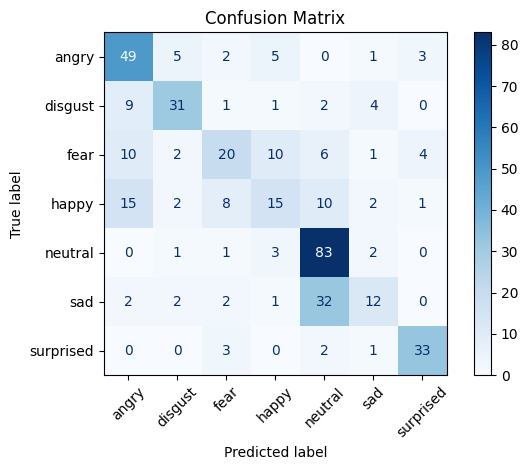

Classification Report:
               precision    recall  f1-score   support

       angry       0.58      0.75      0.65        65
     disgust       0.72      0.65      0.68        48
        fear       0.54      0.38      0.44        53
       happy       0.43      0.28      0.34        53
     neutral       0.61      0.92      0.74        90
         sad       0.52      0.24      0.32        51
   surprised       0.80      0.85      0.82        39

    accuracy                           0.61       399
   macro avg       0.60      0.58      0.57       399
weighted avg       0.59      0.61      0.58       399



In [22]:
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report
import numpy as np
import os

# -------------------------------
# EmotionResNet definition (same as training)
# -------------------------------
class EmotionResNet(nn.Module):
    def __init__(self, num_classes=7):
        super().__init__()
        self.layer1 = nn.Sequential(
            nn.Conv2d(1, 64, 3, 1, 1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(2, 2))
        self.layer2 = nn.Sequential(
            nn.Conv2d(64, 128, 3, 1, 1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(2, 2))
        self.layer3 = nn.Sequential(
            nn.Conv2d(128, 256, 3, 1, 1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.MaxPool2d(2, 2))
        self.layer4 = nn.Sequential(
            nn.Conv2d(256, 512, 3, 1, 1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.AdaptiveAvgPool2d((1, 1)))
        self.fc = nn.Sequential(
            nn.Flatten(),
            nn.Linear(512, 256),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(256, num_classes))

    def forward(self, x):
        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)
        return self.fc(x)

# -------------------------------
# CachedMelDataset (same as training)
# -------------------------------
import numpy as np
import glob
import os
import torch.nn as nn
import torchaudio.transforms as T

class CachedMelDataset(torch.utils.data.Dataset):
    def __init__(self, root_dir, label_map, augment=False):
        self.data = []
        self.augment = augment
        self.augmentations = nn.Sequential(
            T.FrequencyMasking(freq_mask_param=15),
            T.TimeMasking(time_mask_param=20),
        )
        for label_name, label_idx in label_map.items():
            folder = os.path.join(root_dir, label_name)
            files = glob.glob(os.path.join(folder, "*.npy"))
            for f in files:
                mel = np.load(f)
                if mel.shape[1] < 861:
                    pad_width = 861 - mel.shape[1]
                    mel = np.pad(mel, ((0, 0), (0, pad_width)))
                mel = mel[:, :861]
                mel_tensor = torch.tensor(mel, dtype=torch.float32).unsqueeze(0)
                self.data.append((mel_tensor, label_idx))

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        mel_tensor, label = self.data[idx]
        if self.augment:
            mel_tensor = self.augmentations(mel_tensor)
        return mel_tensor, label

# -------------------------------
# Test and Confusion Matrix
# -------------------------------
def test_with_confusion_matrix(model_path, test_dir, label_map):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = EmotionResNet(num_classes=len(label_map))
    model.load_state_dict(torch.load(model_path, map_location=device))
    model.to(device)
    model.eval()

    test_dataset = CachedMelDataset(test_dir, label_map, augment=False)
    test_loader = DataLoader(test_dataset, batch_size=8, shuffle=False)

    all_preds, all_labels = [], []

    with torch.no_grad():
        for inputs, labels in test_loader:
            inputs = inputs.to(device)
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.numpy())

    # Accuracy
    accuracy = np.mean(np.array(all_preds) == np.array(all_labels))
    print(f"Test Accuracy: {accuracy:.4f}")

    # Confusion Matrix
    cm = confusion_matrix(all_labels, all_preds)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=list(label_map.keys()))
    disp.plot(xticks_rotation=45, cmap='Blues')
    plt.title("Confusion Matrix")
    plt.tight_layout()
    plt.show()

    # Classification Report
    report = classification_report(all_labels, all_preds, target_names=list(label_map.keys()))
    print("Classification Report:\n", report)

# -------------------------------
# Run the test
# -------------------------------
if __name__ == "__main__":
    model_path = "/content/drive/MyDrive/deeplearning/models/emotion_model_20250514_210203.pt"
    test_dir = "/content/drive/MyDrive/deeplearning/mel_spectrograms/val"
    label_map = {
        'angry': 0, 'disgust': 1, 'fear': 2,
        'happy': 3, 'neutral': 4, 'sad': 5, 'surprised': 6
    }

    test_with_confusion_matrix(model_path, test_dir, label_map)


In [25]:
def predict_emotion(model_path, spectrogram_path, label_map):
    import torch
    import numpy as np

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # Load the model
    model = EmotionResNet(num_classes=len(label_map))
    model.load_state_dict(torch.load(model_path, map_location=device))
    model.to(device)
    model.eval()

    # Load and preprocess the spectrogram
    mel = np.load(spectrogram_path)
    if mel.shape[1] < 861:
        pad_width = 861 - mel.shape[1]
        mel = np.pad(mel, ((0, 0), (0, pad_width)))
    mel = mel[:, :861]
    mel_tensor = torch.tensor(mel, dtype=torch.float32).unsqueeze(0).unsqueeze(0).to(device)  # [1, 1, 128, 861]

    with torch.no_grad():
        output = model(mel_tensor)
        predicted_idx = torch.argmax(output, dim=1).item()

    # Map index back to label
    idx_to_label = {idx: label for label, idx in label_map.items()}
    predicted_emotion = idx_to_label[predicted_idx]

    print(f"Predicted Emotion: {predicted_emotion}")
    return predicted_emotion


In [26]:
if __name__ == "__main__":
    model_path = "/content/drive/MyDrive/deeplearning/models/emotion_model_20250514_210203.pt"
    spectrogram_path = "/content/drive/MyDrive/deeplearning/mel_spectrograms/val/angry/emodb_03a05Wb.npy"  # or any .npy file
    label_map = {
        'angry': 0, 'disgust': 1, 'fear': 2,
        'happy': 3, 'neutral': 4, 'sad': 5, 'surprised': 6
    }

    predict_emotion(model_path, spectrogram_path, label_map)


Predicted Emotion: angry


In [28]:
if __name__ == "__main__":
    model_path = "/content/drive/MyDrive/deeplearning/models/emotion_model_20250514_210203.pt"
    spectrogram_path = "/content/drive/MyDrive/deeplearning/mel_spectrograms/val/happy/emodb_08b10Fd.npy"  # or any .npy file
    label_map = {
        'angry': 0, 'disgust': 1, 'fear': 2,
        'happy': 3, 'neutral': 4, 'sad': 5, 'surprised': 6
    }

    predict_emotion(model_path, spectrogram_path, label_map)


Predicted Emotion: happy


In [3]:
!nvidia-smi

Wed May 14 18:35:48 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   69C    P0             31W /   70W |    1884MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----